# ECE 232E Project 4 — Part 2 (Q9 to Q24)

Complete notebook following the official helper's structure. Built on **igraph** (Python).

Each question gets its own markdown header so navigation is easy. Run cells top-to-bottom; intermediate variables (`g`, `mst`, `tri_g`, `tri_g_trimmed`, `road_map`, etc.) carry forward.

**Data files needed in working directory:**
- `los_angeles_censustracts.json`
- `los_angeles-censustracts-2019-4-All-MonthlyAggregate.csv`

## Setup

In [1]:
from igraph import *
import json
import random
import numpy as np
from numpy import linalg
import itertools
import matplotlib.pyplot as plt
from scipy.spatial import Delaunay  # needed for triangulation
import os
import pandas as pd
from copy import deepcopy

In [2]:
random.seed(2022)
np.random.seed(2022)

## Q9 — Build the graph G

Read GeoJSON, compute centroids, read CSV (December only), build undirected weighted graph, keep largest connected component, merge duplicate edges.

In [3]:
with open('data/los_angeles_censustracts.json') as f:
    census_tracts = json.loads(f.readline())

In [4]:
# Inspect first feature's properties
census_tracts['features'][0]['properties']

{'MOVEMENT_ID': '1', 'TRACT': '480302', 'DISPLAY_NAME': 'Census Tract 480302'}

In [5]:
# Centroid example for the first feature: mean of polygon corner coordinates
np.array(census_tracts['features'][0]['geometry']['coordinates'][0]).mean(axis=0)  # [longitude, latitude]

array([-118.12053321,   34.10309557])

In [6]:
display_names = dict()
coordinates = dict()

for area in census_tracts['features']:
    id = int(area['properties']['MOVEMENT_ID'])
    display_name = area['properties']['DISPLAY_NAME']
    display_names[id] = display_name
    a = area['geometry']['coordinates'][0]
    coordinates[id] = np.array(a if type(a[0][0]) == float else a[0]).mean(axis=0)

In [7]:
for i in range(5):
    key = i + 1
    print('{}: {}, {}'.format(key, display_names[key], coordinates[key]))

1: Census Tract 480302, [-118.12053321   34.10309557]
2: Census Tract 480303, [-118.13785063   34.09645121]
3: Census Tract 480304, [-118.13138209   34.09626386]
4: Census Tract 480400, [-118.13224544   34.10349303]
5: Census Tract 480500, [-118.14492317   34.0986815 ]


In [8]:
# Build the graph. Vertex index = MOVEMENT_ID - 1 (0-indexed)
g = Graph(directed=False)
g.add_vertices(len(display_names))
g.vs['display_name'] = list(display_names.values())  # index = id - 1
g.vs['coordinates'] = list(coordinates.values())

In [9]:
month_filter = {12}  # December only (4th quarter monthly aggregate)

edges = []
weights = []

with open('data/los_angeles-censustracts-2019-4-All-MonthlyAggregate.csv') as f:
    f.readline()  # skip the header line

    while True:
        line = f.readline()
        if line == '':
            break  # end of file

        vals = line.strip().split(',')

        # read edge info
        src, dest, month, dist = int(vals[0]), int(vals[1]), int(vals[2]), float(vals[3])

        # if not December, skip
        if month not in month_filter:
            continue

        edges.append((src - 1, dest - 1))
        weights.append(dist)

In [10]:
g.add_edges(edges)
g.es['weight'] = weights
del edges, weights

In [11]:
print(len(g.vs), len(g.es))

2716 1692450


In [12]:
# Keep only the giant connected component
components = g.components()
gcc = max(components, key=len)
vs_to_delete = [i for i in range(len(g.vs)) if i not in gcc]
g.delete_vertices(vs_to_delete)

# Merge duplicate edges (A->B and B->A become one edge with averaged weight)
g = g.simplify(combine_edges=dict(weight='mean'))

In [13]:
print(len(g.vs), len(g.es))

2649 1003858


## Q10 — Minimum spanning tree + edge endpoints

Build MST, then print coordinates of ~10 edges. To get street addresses, paste each `(lat, lon)` into Google Maps.

In [14]:
mst = g.spanning_tree(weights=g.es['weight'])

In [15]:
edf = mst.get_edge_dataframe()
edf.head()

,source,target,weight
edge ID,,,
0,0,2,129.765
1,0,13,118.335
2,1,2,90.235
3,1,3,126.475
4,1,9,125.675


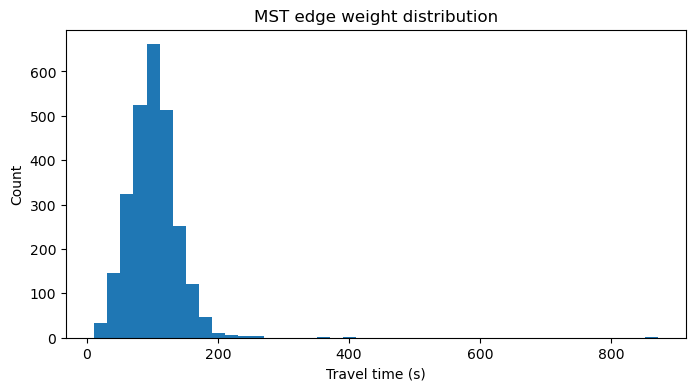

In [16]:
# Histogram of MST edge weights (travel times in seconds)
weights = mst.es['weight']
binwidth = 20
bins = np.arange(min(weights), max(weights) + binwidth, binwidth)
plt.figure(figsize=(8, 4))
plt.hist(weights, bins=bins)
plt.xlabel('Travel time (s)')
plt.ylabel('Count')
plt.title('MST edge weight distribution')
plt.show()

In [17]:
# Print ~10 MST edges: distance, time, and (lat, lon) endpoints
# Paste each (lat, lon) into Google Maps for the street address
print('Sample MST edges. Paste coordinates into Google Maps for addresses:\n')
print('{:<35}{:<35}{:<12}{}'.format('Endpoint A (lat, lon)', 'Endpoint B (lat, lon)', 'Time (s)', 'Distance (mi)'))
print('-' * 110)
for i, e in enumerate(mst.es):
    c1 = mst.vs[e.source]['coordinates']  # [lon, lat]
    c2 = mst.vs[e.target]['coordinates']
    dist_mi = linalg.norm(c1 - c2) * 69
    print('{:<35}{:<35}{:<12.1f}{:.3f}'.format(
        '({:.5f}, {:.5f})'.format(c1[1], c1[0]),
        '({:.5f}, {:.5f})'.format(c2[1], c2[0]),
        e['weight'],
        dist_mi
    ))
    if i >= 10:
        break

Sample MST edges. Paste coordinates into Google Maps for addresses:

Endpoint A (lat, lon)              Endpoint B (lat, lon)              Time (s)    Distance (mi)
--------------------------------------------------------------------------------------------------------------
(34.10310, -118.12053)             (34.09626, -118.13138)             129.8       0.885
(34.10310, -118.12053)             (34.09585, -118.11656)             118.3       0.570
(34.09645, -118.13785)             (34.09626, -118.13138)             90.2        0.447
(34.09645, -118.13785)             (34.10349, -118.13225)             126.5       0.621
(34.09645, -118.13785)             (34.08539, -118.14184)             125.7       0.812
(34.09626, -118.13138)             (34.08759, -118.12912)             119.9       0.618
(34.10349, -118.13225)             (34.09868, -118.14492)             125.2       0.936
(34.09868, -118.14492)             (34.09596, -118.15024)             91.8        0.412
(34.09863, -118.1528

## Q11 — Triangle inequality

Sample 1000 triangles (triples of vertices where all 3 edges exist in `g`), then count how many satisfy the triangle inequality.

In [18]:
def is_triangle(sides):
    """Return True iff three sides can form a triangle (a+b >= c for largest c)."""
    s = sorted(sides)
    return s[0] + s[1] >= s[2]

print('Test:', is_triangle([1, 4, 2]), is_triangle([3, 5, 3]))  # False, True

Test: False True


In [19]:
def sample_triangles(g, n_samples):
    """Sample n random triples of vertices that form a closed triangle in g."""
    result = []
    n_v = len(g.vs)
    attempts = 0
    max_attempts = n_samples * 500
    while len(result) < n_samples and attempts < max_attempts:
        attempts += 1
        vs = random.sample(range(n_v), 3)
        if (g.are_connected(vs[0], vs[1])
            and g.are_connected(vs[1], vs[2])
            and g.are_connected(vs[0], vs[2])):
            result.append(vs)
    return result

In [20]:
n_samples = 1000  # WARNING: larger samples slow down significantly
triangles = 0
sampled = sample_triangles(g, n_samples)

for triangle_vs in sampled:
    edge_lengths = []
    for i in range(3):
        for j in range(i):
            edge_lengths.append(
                min(g.es.select(_between=([triangle_vs[i]], [triangle_vs[j]]))['weight'])
            )
    triangles += is_triangle(edge_lengths)

print('Triangle inequality holds in {}% of {} sampled triangles'.format(
    round(100.0 * triangles / len(sampled), 1), len(sampled)
))

/var/folders/x6/6rzyb8vx5ys6dv9f7rs7qk600000gn/T/ipykernel_82177/3773813479.py:10: DeprecationWarning: Graph.are_connected() is deprecated; use Graph.are_adjacent() instead
  if (g.are_connected(vs[0], vs[1])
/var/folders/x6/6rzyb8vx5ys6dv9f7rs7qk600000gn/T/ipykernel_82177/3773813479.py:11: DeprecationWarning: Graph.are_connected() is deprecated; use Graph.are_adjacent() instead
  and g.are_connected(vs[1], vs[2])
/var/folders/x6/6rzyb8vx5ys6dv9f7rs7qk600000gn/T/ipykernel_82177/3773813479.py:12: DeprecationWarning: Graph.are_connected() is deprecated; use Graph.are_adjacent() instead
  and g.are_connected(vs[0], vs[2])):


Triangle inequality holds in 92.0% of 1000 sampled triangles


## Q12 — TSP 1-approximation

Algorithm (from Papadimitriou & Steiglitz Ch.17 p.414):
1. Build MST T
2. DFS pre-order starting from any node
3. That order is the TSP tour (close it by returning to start)

Then compute the empirical upper bound on the approximation ratio: `tsp_cost / mst_cost`.

In [21]:
def preorder_traversal(root, root_parent=None):
    """Iterative DFS pre-order traversal (avoids recursion-limit issues at V~1300)."""
    result = []
    stack = [(root, root_parent)]
    while stack:
        v, parent = stack.pop()
        result.append(v)
        # Children = neighbours except the parent
        children = [n for n in v.neighbors() if parent is None or n.index != parent.index]
        # Reverse so the original child order is preserved on the LIFO stack
        for child in reversed(children):
            stack.append((child, v))
    return result

### Preorder Traversal Demo

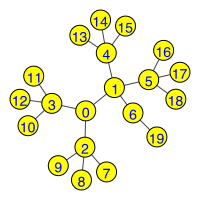

In [22]:
# Quick sanity check on a small tree
t = Graph.Tree(20, 3)

visual_style = {}
visual_style["vertex_color"] = 'yellow'
visual_style["vertex_label"] = [v.index for v in t.vs]
visual_style["vertex_label_color"] = 'blue'
visual_style["bbox"] = (200, 200)

plot(t, **visual_style)

In [23]:
print([v.index for v in preorder_traversal(t.vs[0])])

[0, 1, 4, 13, 14, 15, 5, 16, 17, 18, 6, 19, 2, 7, 8, 9, 3, 10, 11, 12]


### Actual Data — TSP from MST

In [24]:
# TSP order = pre-order DFS of the MST starting at vertex 0
tsp = [v.index for v in preorder_traversal(mst.vs[0])]
print('IDs:\n' + '-' * 10)
print('\n'.join([mst.vs[i]['display_name'] for i in tsp[:20]]))
print('... ({} total nodes in tour)'.format(len(tsp)))

IDs:
----------
Census Tract 480302
Census Tract 480304
Census Tract 480303
Census Tract 480400
Census Tract 480500
Census Tract 480804
Census Tract 480704
Census Tract 480704
Census Tract 480703
Census Tract 201120
Census Tract 201501
Census Tract 201503
Census Tract 201401
Census Tract 201200
Census Tract 201110
Census Tract 201301
Census Tract 199110
Census Tract 199120
Census Tract 199202
Census Tract 199201
... (2649 total nodes in tour)


In [25]:
# Hop distances = straight-line distance (miles) between consecutive nodes in the tour
all_coordinates = np.array(g.vs['coordinates'])
tour_with_return = tsp + [tsp[0]]
coords_seq = all_coordinates[tour_with_return, :]
hop_distances = np.linalg.norm(np.diff(coords_seq, axis=0), axis=1) * 69
print('Hop distances (first 10):\n' + '-' * 10)
print('\n'.join(['{:.3f}'.format(x) for x in hop_distances[:10].tolist()]))
print('Total straight-line tour length: {:.1f} miles'.format(hop_distances.sum()))

Hop distances (first 10):
----------
0.885
0.447
0.621
0.936
0.412
0.256
0.204
0.180
0.446
0.525
Total straight-line tour length: 2740.4 miles


### Measuring Relative Performance Guarantee

In [26]:
mst_cost = sum(mst.es['weight'])
print('MST Cost (seconds):', round(mst_cost))

MST Cost (seconds): 269085


<hr><b><font color="red">WARNING: SLOW!</font></b> ~5-15 minutes for V≈1300. Each iteration calls one shortest-path query.

In [27]:
# TSP tour cost: for each consecutive pair in the tour, use the shortest-path length
# in g (the original graph), since the direct edge may not exist between shortcut nodes.
tsp_cost = 0
for i in range(len(tsp)):
    if i % 100 == 0:
        print(i)
    src = tsp[i]
    dst = tsp[(i + 1) % len(tsp)]
    sp = g.shortest_paths(source=src, target=dst, weights='weight')[0][0]
    tsp_cost += sp

0


/var/folders/x6/6rzyb8vx5ys6dv9f7rs7qk600000gn/T/ipykernel_82177/1366099662.py:9: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  sp = g.shortest_paths(source=src, target=dst, weights='weight')[0][0]


100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600


In [28]:
print('MST Cost:', round(mst_cost))
print('TSP Cost:', round(tsp_cost))
print('Ratio (upper bound on rho):', round(tsp_cost / mst_cost, 2))
print('Theoretical guarantee: rho <= 2.0')

MST Cost: 269085
TSP Cost: 422811
Ratio (upper bound on rho): 1.57
Theoretical guarantee: rho <= 2.0


## Q13 — Plot Santa's TSP trajectory

The tour should look tangled (DFS preorder doesn't optimize for spatial locality), but it should visit every node exactly once.

In [29]:
all_coordinates = np.array(g.vs['coordinates'])
tsp_coordinates = all_coordinates[tsp, :]
tsp_coordinates = np.vstack([tsp_coordinates, tsp_coordinates[0, :]])  # close the loop

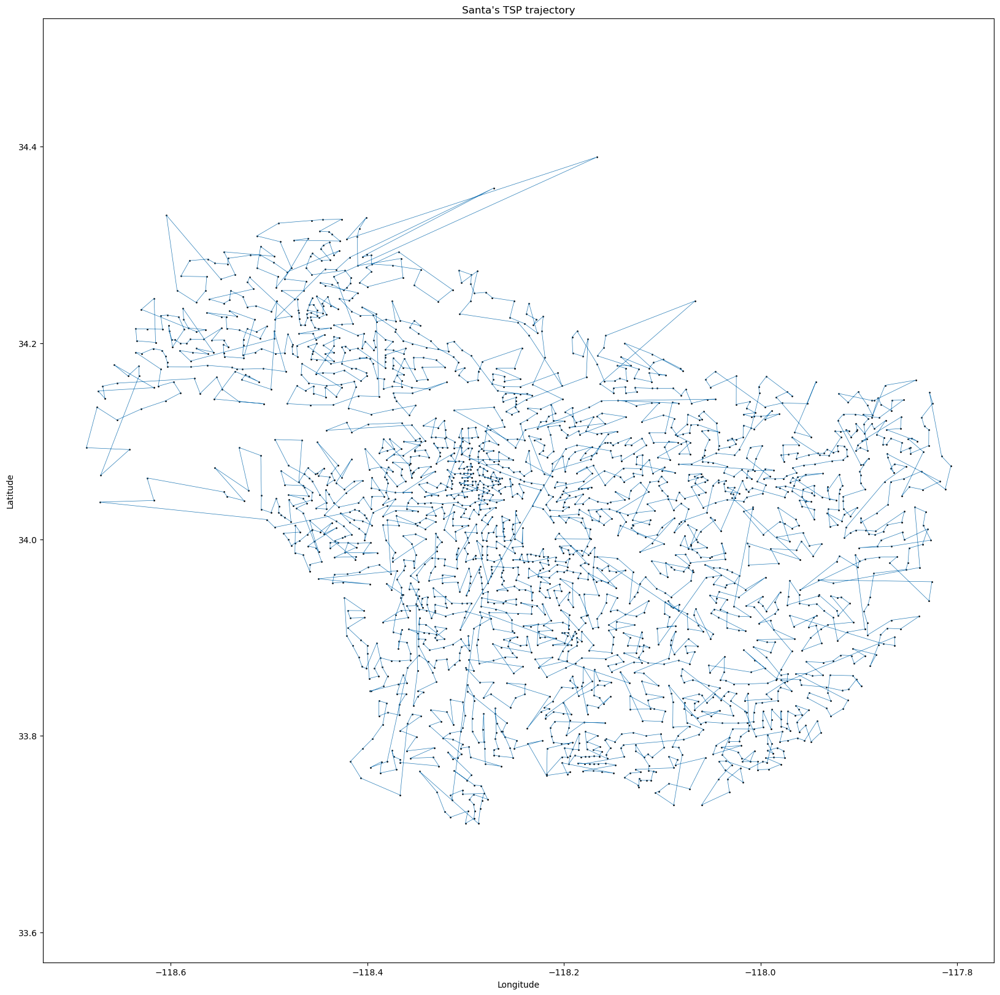

In [30]:
plt.figure(figsize=(20, 20))
plt.plot(tsp_coordinates[:, 0], tsp_coordinates[:, 1], '-', linewidth=0.5)
plt.scatter(all_coordinates[:, 0], all_coordinates[:, 1], s=1, c='black')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title("Santa's TSP trajectory")
plt.axis('equal')
plt.show()

## Q14 — Delaunay triangulation

Build `tri_g` by inducing the subgraph of g on edges that appear in Delaunay triangles of the node coordinates.

In [31]:
# Numpy array of all node coordinates -- needed by Delaunay and for plotting
coords_arr = np.array(g.vs['coordinates'])
tri = Delaunay(coords_arr)

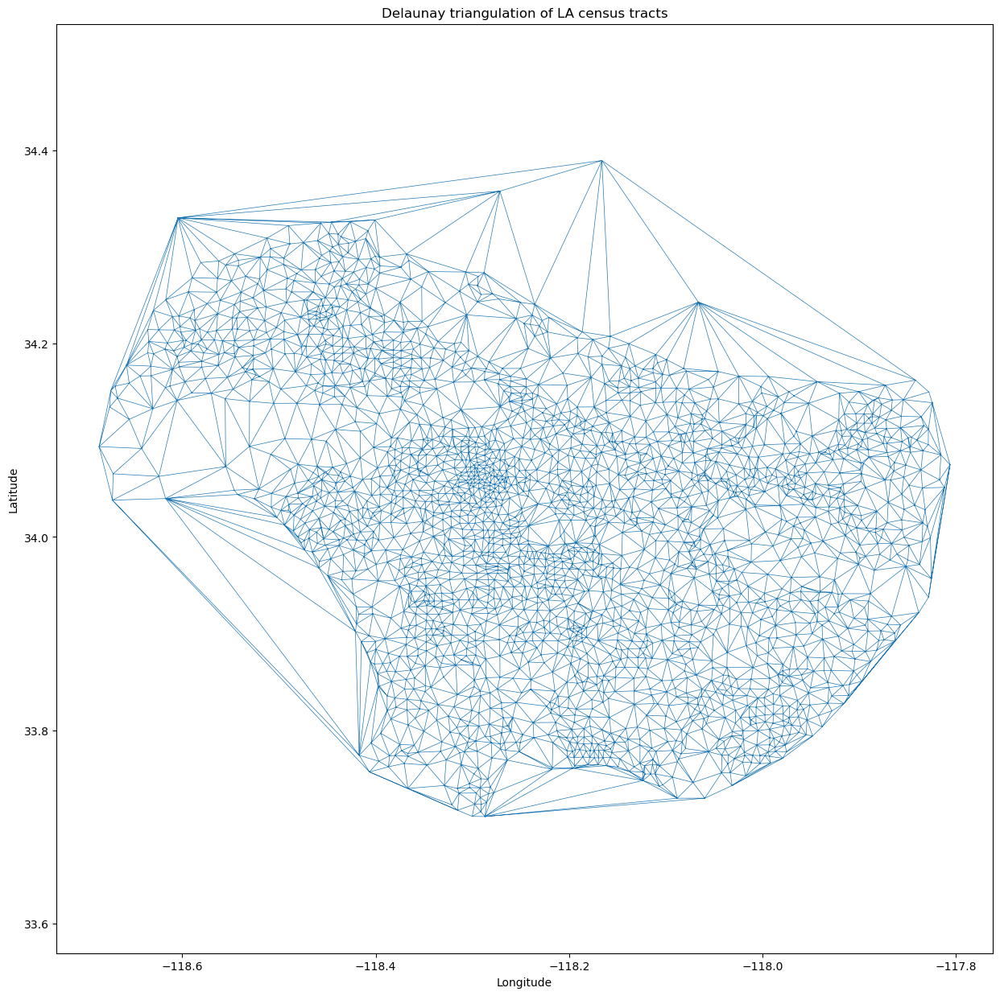

In [32]:
plt.figure(figsize=(15, 15))
plt.triplot(coords_arr[:, 0], coords_arr[:, 1], tri.simplices.copy(), linewidth=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Delaunay triangulation of LA census tracts')
plt.axis('equal')
plt.show()

In [33]:
# Each simplex = 3 vertex indices = 3 edges. Keep only edges that also exist in g.
edges_to_induce = set()
for i in range(tri.simplices.shape[0]):
    for col1, col2 in ((0, 1), (1, 2), (0, 2)):
        v1 = int(tri.simplices[i, col1])
        v2 = int(tri.simplices[i, col2])
        eid = g.get_eid(v1, v2, error=False)
        if eid != -1:
            edges_to_induce.add(eid)
edges_to_induce = list(edges_to_induce)
print('Induced edges:', len(edges_to_induce))

Induced edges: 7788


In [34]:
tri_g = g.subgraph_edges(edges_to_induce)
print('tri_g: {} vertices, {} edges'.format(len(tri_g.vs), len(tri_g.es)))

tri_g: 2648 vertices, 7788 edges


## Q15 — Estimate traffic flow capacities

For each edge in `tri_g`, compute capacity in cars/hour. See the derivation in your report.

Formula:
- `speed = distance_miles / time_hours`  (mph)
- `space_per_car = car_length + 2-second_gap = 0.003 + 2·speed/3600`  (miles)
- `cars_per_lane = speed / space_per_car`  (cars/hr)
- `capacity = 2 lanes × cars_per_lane`

In [35]:
edge_ends = np.array([[e.source, e.target] for e in tri_g.es])
sources, targets = edge_ends[:, 0], edge_ends[:, 1]

coords_arr = np.array(tri_g.vs['coordinates'])
distances = np.linalg.norm(coords_arr[sources] - coords_arr[targets], axis=1) * 69  # miles
times = np.array(tri_g.es['weight']) / 3600.0  # hours (weight is in seconds)
speeds = distances / times  # mph

car_length = 0.003  # 5 m in miles
safety_distances = speeds * (2 / 3600)  # 2-second gap converted to miles
cars_per_mile = 1.0 / (car_length + safety_distances)
n_lanes = 2
cars_per_hour = cars_per_mile * speeds * n_lanes

In [36]:
tri_g.es['capacity'] = cars_per_hour
print('Mean capacity: {:.0f} cars/hr'.format(np.mean(cars_per_hour)))
print('Median speed: {:.1f} mph'.format(np.median(speeds)))

Mean capacity: 2727 cars/hr
Median speed: 17.3 mph


## Q16 — Max flow Malibu → Long Beach

Find the nodes in `tri_g` whose centroids are closest to the given coordinates, then compute (a) max flow with edge capacities, and (b) edge-disjoint path count.

In [37]:
source_coordinates = [-118.5670548, 34.0458901]  # malibu (lon, lat)
dest_coordinates = [-118.1819374, 33.759958]      # long beach

### Calculate Max Flow

In [38]:
coords_arr = np.array(tri_g.vs['coordinates'])
source_idx = int(np.argmin(np.linalg.norm(coords_arr - source_coordinates, axis=1)))
dest_idx = int(np.argmin(np.linalg.norm(coords_arr - dest_coordinates, axis=1)))
print('Source node:', source_idx, '->', tri_g.vs[source_idx]['display_name'])
print('Dest node:  ', dest_idx, '->', tri_g.vs[dest_idx]['display_name'])

Source node: 1511 -> Census Tract 262604
Dest node:   663 -> Census Tract 576601


In [39]:
mf = tri_g.maxflow(source_idx, dest_idx, capacity=tri_g.es['capacity'])
n_independent_roads = tri_g.edge_connectivity(source=source_idx, target=dest_idx)
print('Number of independent roads:', n_independent_roads)
print('Number of cars per hour:    ', round(mf.value))

Number of independent roads: 4
Number of cars per hour:     11074


## Q17 — Trim large-distance (fake) edges

Delaunay creates edges across water/mountains. Remove edges with travel time above a threshold.

In [40]:
trim_thresh = 800  # seconds

In [41]:
edges_to_induce = tri_g.es.select(weight_le=trim_thresh)
tri_g_trimmed = tri_g.subgraph_edges(edges_to_induce)

# Keep largest connected component after pruning (some isolated nodes may appear)
components = tri_g_trimmed.components()
gcc = max(components, key=len)
vs_to_delete = [i for i in range(len(tri_g_trimmed.vs)) if i not in gcc]
tri_g_trimmed.delete_vertices(vs_to_delete)
print('tri_g_trimmed: {} vertices, {} edges'.format(len(tri_g_trimmed.vs), len(tri_g_trimmed.es)))

tri_g_trimmed: 2647 vertices, 7756 edges


### Visualizing trimming

<hr><b><font color="red">WARNING: SLOW!</font></b>

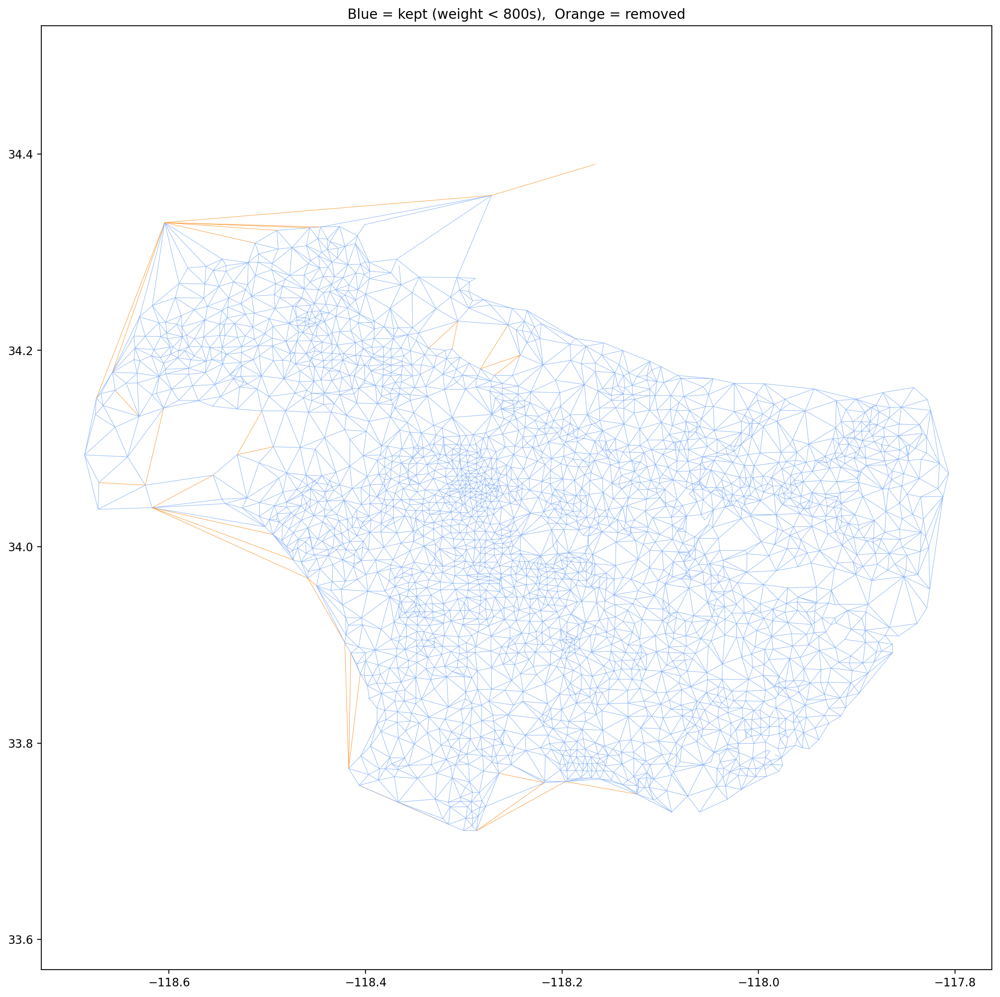

In [42]:
# Plot tri_g, coloring trimmed edges differently
plt.figure(figsize=(15, 15), dpi=200)
for e in tri_g.es:
    v1 = tri_g.vs[e.source]['coordinates']
    v2 = tri_g.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x = data[:, 0]
    y = data[:, 1]
    plt.plot(x, y, '#8ab4f7' if e['weight'] < trim_thresh else '#fc9c3c',
             linewidth=0.4)

plt.axis('equal')
plt.title('Blue = kept (weight < {}s),  Orange = removed'.format(trim_thresh))
plt.show()

## Q18 — Max flow on the trimmed graph

Repeat Q16 with `tri_g_trimmed`. Both numbers should drop because fake edges previously added phantom routes.

In [43]:
# Recompute capacity on tri_g_trimmed (it should be inherited from tri_g via subgraph_edges,
# but be explicit to be safe)
edge_ends = np.array([[e.source, e.target] for e in tri_g_trimmed.es])
sources, targets = edge_ends[:, 0], edge_ends[:, 1]
coords_arr = np.array(tri_g_trimmed.vs['coordinates'])
distances = np.linalg.norm(coords_arr[sources] - coords_arr[targets], axis=1) * 69
times = np.array(tri_g_trimmed.es['weight']) / 3600.0
speeds = distances / times
safety_distances = speeds * (2 / 3600)
cars_per_mile = 1.0 / (car_length + safety_distances)
cars_per_hour = cars_per_mile * speeds * n_lanes
tri_g_trimmed.es['capacity'] = cars_per_hour

In [44]:
source_idx_t = int(np.argmin(np.linalg.norm(coords_arr - source_coordinates, axis=1)))
dest_idx_t = int(np.argmin(np.linalg.norm(coords_arr - dest_coordinates, axis=1)))
print('Source node:', source_idx_t, '->', tri_g_trimmed.vs[source_idx_t]['display_name'])
print('Dest node:  ', dest_idx_t, '->', tri_g_trimmed.vs[dest_idx_t]['display_name'])

mf_t = tri_g_trimmed.maxflow(source_idx_t, dest_idx_t, capacity=tri_g_trimmed.es['capacity'])
n_independent_roads_t = tri_g_trimmed.edge_connectivity(source=source_idx_t, target=dest_idx_t)
print('Number of independent roads (trimmed):', n_independent_roads_t)
print('Number of cars per hour (trimmed):    ', round(mf_t.value))

Source node: 1511 -> Census Tract 262604
Dest node:   663 -> Census Tract 576601
Number of independent roads (trimmed): 4
Number of cars per hour (trimmed):     11074


## Q19 — Strategy 1: geo distance, static

Pick 20 pairs with the highest `extra_distance(v,s) = shortest_distance(v,s) - euclidean(v,s)` from the trimmed graph (using geographic distance as edge weight).

In [45]:
road_map = deepcopy(tri_g_trimmed)
vcount = len(road_map.vs)

# Edge geo distance attribute
edge_ends = np.array([[e.source, e.target] for e in road_map.es])
sources, targets = edge_ends[:, 0], edge_ends[:, 1]
coords_arr = np.array(road_map.vs['coordinates'])
distances = np.linalg.norm(coords_arr[sources] - coords_arr[targets], axis=1) * 69
road_map.es['geo_distance'] = distances
print('Max geo distance among existing edges: {:.3f} mi'.format(max(distances)))

Max geo distance among existing edges: 12.219 mi


<hr><b><font color="red">All-pairs shortest paths — may take 30s to 2min.</font></b>

In [46]:
# All-pairs shortest path distance (using geo_distance weights)
shortest_path_distance = road_map.shortest_paths(weights='geo_distance')
shortest_path_distance = np.array(shortest_path_distance)
print('Shortest path distance matrix shape:', shortest_path_distance.shape)

Shortest path distance matrix shape: (2647, 2647)


/var/folders/x6/6rzyb8vx5ys6dv9f7rs7qk600000gn/T/ipykernel_82177/2228211350.py:2: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  shortest_path_distance = road_map.shortest_paths(weights='geo_distance')


In [47]:
# Euclidean (straight-line) distance matrix
diff = coords_arr[:, None, :] - coords_arr[None, :, :]
actual_geo_distances = np.linalg.norm(diff, axis=2) * 69

# Difference per pair
differences = shortest_path_distance - actual_geo_distances

# Mask self-edges and existing edges so we don't 'rebuild' them
np.fill_diagonal(differences, -np.inf)
for e in road_map.es:
    differences[e.source, e.target] = -np.inf
    differences[e.target, e.source] = -np.inf

In [48]:
ind = np.argsort(differences.flatten())[::-1]   # descending

In [49]:
new_static_edges = []
print('Top 20 new edges (Strategy 1):')
for i in range(40):
    # differences is symmetric -> argsort returns each pair twice; skip duplicates
    if i % 2 == 0:
        continue
    flat_idx = ind[i]
    v1 = int(flat_idx // vcount)
    v2 = int(flat_idx % vcount)
    newedge = sorted([v1, v2])
    print('  {} extra_distance = {:.3f} mi'.format(newedge, differences[v1, v2]))
    new_static_edges.append(newedge)

Top 20 new edges (Strategy 1):
  [1783, 2416] extra_distance = 8.047 mi
  [2140, 2419] extra_distance = 8.016 mi
  [1860, 2416] extra_distance = 7.876 mi
  [382, 2419] extra_distance = 7.823 mi
  [383, 2419] extra_distance = 7.617 mi
  [1699, 1783] extra_distance = 7.513 mi
  [391, 2419] extra_distance = 7.502 mi
  [1901, 2419] extra_distance = 7.460 mi
  [381, 2419] extra_distance = 7.449 mi
  [1699, 1860] extra_distance = 7.355 mi
  [2163, 2419] extra_distance = 7.354 mi
  [386, 2419] extra_distance = 7.318 mi
  [390, 2419] extra_distance = 7.315 mi
  [1904, 2419] extra_distance = 7.280 mi
  [45, 2419] extra_distance = 7.269 mi
  [1783, 2413] extra_distance = 7.268 mi
  [1906, 2419] extra_distance = 7.268 mi
  [2158, 2419] extra_distance = 7.268 mi
  [1902, 2419] extra_distance = 7.265 mi
  [392, 2419] extra_distance = 7.254 mi


In [50]:
# Add the new edges
road_map_static = deepcopy(tri_g_trimmed)
coords_arr_s = np.array(road_map_static.vs['coordinates'])
for edg in new_static_edges:
    start, end = edg
    dist = np.linalg.norm(coords_arr_s[start] - coords_arr_s[end]) * 69
    road_map_static.add_edge(start, end, weight=0.0, geo_distance=dist)
print('road_map_static now has {} edges (was {})'.format(
    len(road_map_static.es), len(tri_g_trimmed.es)
))

road_map_static now has 7776 edges (was 7756)


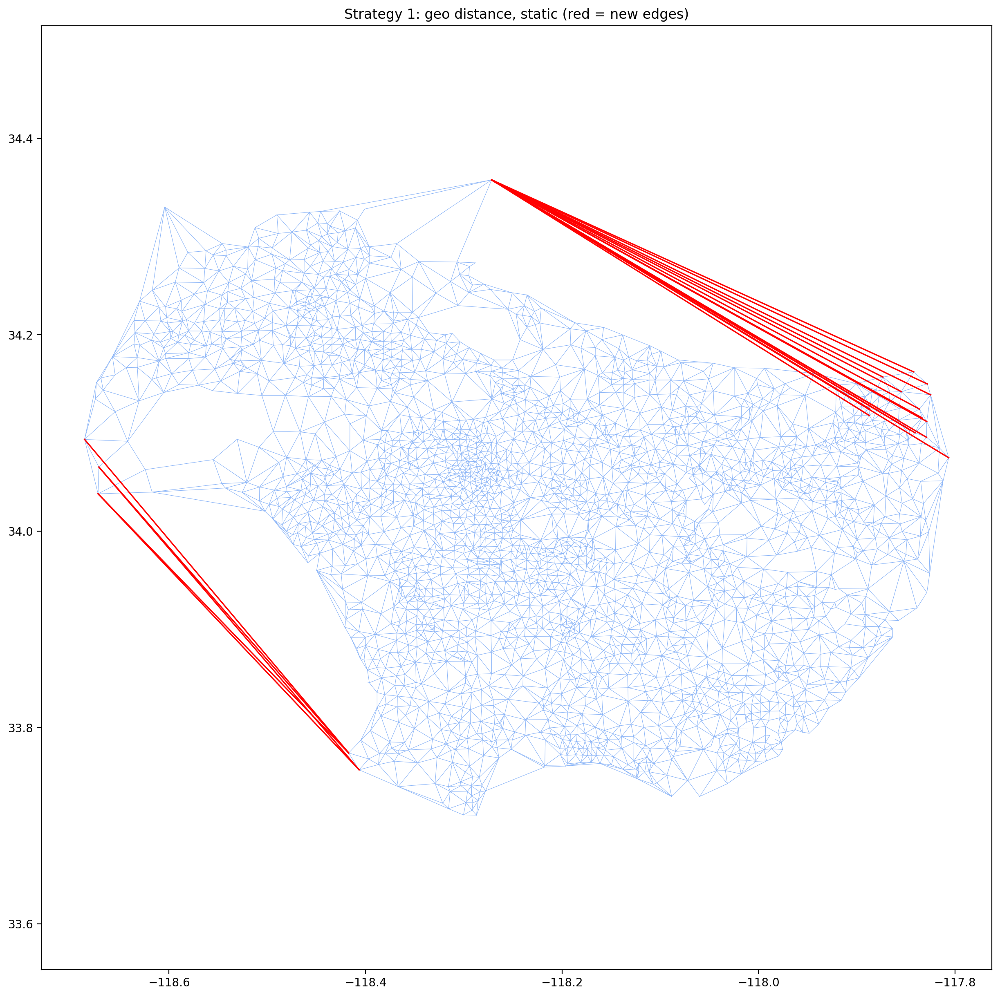

In [51]:
# Plot — new edges in red, existing in blue
plt.figure(figsize=(15, 15), dpi=200)
for e in road_map_static.es:
    cur_edge = sorted([e.source, e.target])
    v1 = road_map_static.vs[e.source]['coordinates']
    v2 = road_map_static.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x, y = data[:, 0], data[:, 1]
    if cur_edge in new_static_edges:
        plt.plot(x, y, '#FF0000', linewidth=1.2)
    else:
        plt.plot(x, y, '#8ab4f7', linewidth=0.4)
plt.axis('equal')
plt.title('Strategy 1: geo distance, static (red = new edges)')
plt.show()

**Time complexity of Strategy 1:** All-pairs Dijkstra dominates, giving `O(V·(V+E)·log V)`. The argsort on the V×V difference matrix is `O(V² log V)`.

## Q20 — Strategy 2: geo distance with random frequency

Same as Strategy 1 but multiply each pair's difference by a random frequency in `[1, 1000]`.

In [52]:
# A, B >1000, freq:10 ->10,000
# C, D = 500 , freq=10,000 -> 5,000,000  (higher despite smaller distance)

In [53]:
np.random.seed(2022)
frequencies = np.random.randint(1, 1001, (vcount, vcount))
frequencies = (frequencies + frequencies.T) // 2   # symmetric (same demand A->B and B->A)
print('frequencies shape:', frequencies.shape)

frequencies shape: (2647, 2647)


In [54]:
difference_frequency = np.multiply(differences, frequencies)
# differences already has -inf on diagonal and on existing edges, so masking is preserved

In [55]:
ind = np.argsort(difference_frequency.flatten())[::-1]

In [56]:
new_freq_edges = []
print('Top 20 new edges (Strategy 2):')
for i in range(40):
    if i % 2 == 0:
        continue
    flat_idx = ind[i]
    v1 = int(flat_idx // vcount)
    v2 = int(flat_idx % vcount)
    newedge = sorted([v1, v2])
    print('  {} weighted_extra = {:.0f}'.format(newedge, difference_frequency[v1, v2]))
    new_freq_edges.append(newedge)

Top 20 new edges (Strategy 2):
  [2141, 2419] weighted_extra = 6709
  [2164, 2419] weighted_extra = 6492
  [989, 1510] weighted_extra = 6293
  [1783, 2413] weighted_extra = 6084
  [1906, 2419] weighted_extra = 6040
  [383, 2419] weighted_extra = 5941
  [2057, 2419] weighted_extra = 5890
  [2156, 2419] weighted_extra = 5858
  [2052, 2419] weighted_extra = 5843
  [2419, 2472] weighted_extra = 5808
  [49, 2419] weighted_extra = 5771
  [2419, 2463] weighted_extra = 5708
  [2193, 2419] weighted_extra = 5705
  [2161, 2419] weighted_extra = 5695
  [69, 2419] weighted_extra = 5666
  [1860, 2413] weighted_extra = 5519
  [979, 1511] weighted_extra = 5508
  [430, 1783] weighted_extra = 5508
  [231, 2419] weighted_extra = 5495
  [66, 2419] weighted_extra = 5482


In [57]:
# Build the graph with frequency-selected edges (used in Q24 comparison)
road_map_freq = deepcopy(tri_g_trimmed)
coords_arr_f = np.array(road_map_freq.vs['coordinates'])
for edg in new_freq_edges:
    start, end = edg
    dist = np.linalg.norm(coords_arr_f[start] - coords_arr_f[end]) * 69
    road_map_freq.add_edge(start, end, weight=0.0, geo_distance=dist)

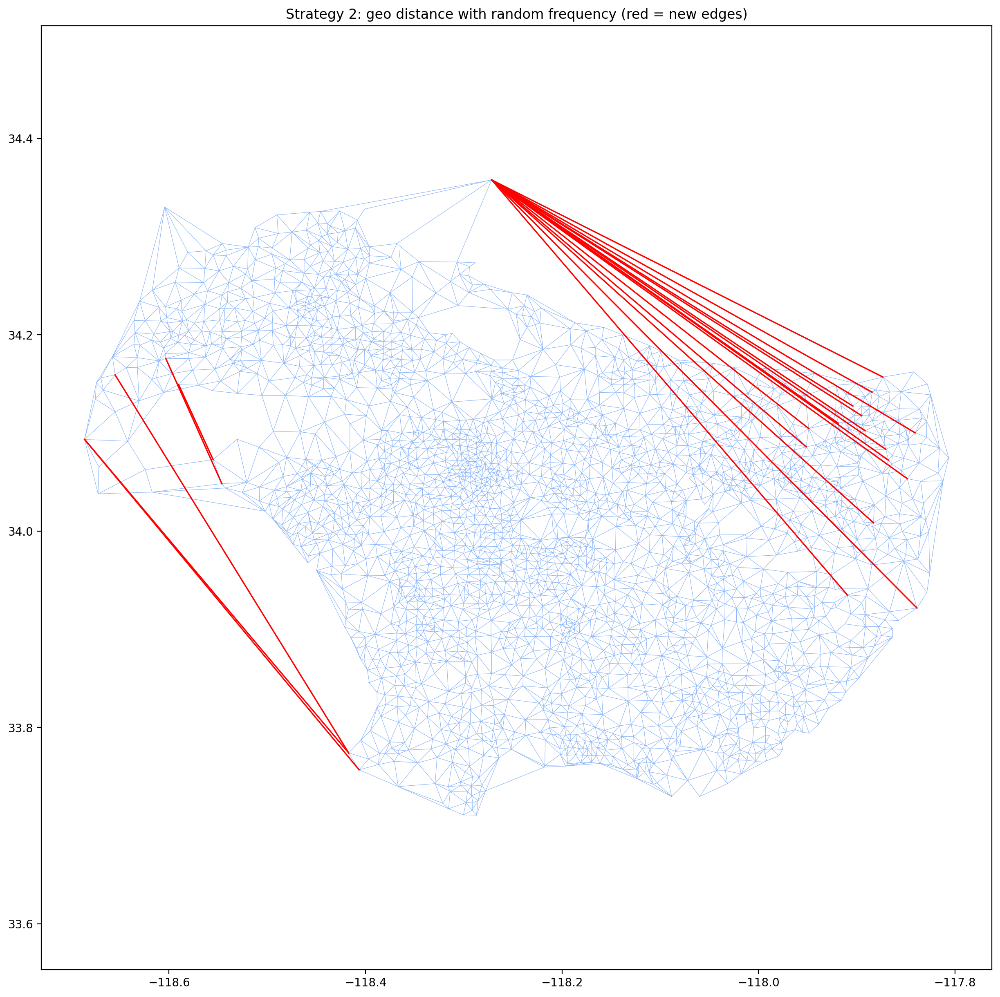

In [58]:
# Plot — new freq-weighted edges in red, existing in blue
plt.figure(figsize=(15, 15), dpi=200)
for e in road_map_freq.es:
    cur_edge = sorted([e.source, e.target])
    v1 = road_map_freq.vs[e.source]['coordinates']
    v2 = road_map_freq.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x, y = data[:, 0], data[:, 1]
    if cur_edge in new_freq_edges:
        plt.plot(x, y, '#FF0000', linewidth=1.2)
    else:
        plt.plot(x, y, '#8ab4f7', linewidth=0.4)
plt.axis('equal')
plt.title('Strategy 2: geo distance with random frequency (red = new edges)')
plt.show()

**Time complexity of Strategy 2:** Same as Strategy 1 — `O(V·(V+E)·log V)`. The frequency multiplication is `O(V²)`.

## Q21 — Strategy 3: geo distance, dynamic

Recompute extra distance after each added edge. Repeats 20 times.

**Time complexity:** `O(k · V · (V+E) · log V)` for k=20 iterations of all-pairs Dijkstra.

<hr><b><font color="red">WARNING: SLOW!</font></b> Roughly 20× Strategy 1's shortest-path step.

In [59]:
road_map_dynamic = deepcopy(road_map)   # already has geo_distance
budget = 20
new_dynamic_edges = []

for iteration in range(budget):
    # Current all-pairs shortest path (in geo distance)
    sp = np.array(road_map_dynamic.shortest_paths(weights='geo_distance'))

    # Recompute euclidean matrix (constant but cheap to redo)
    coords_d = np.array(road_map_dynamic.vs['coordinates'])
    diff = coords_d[:, None, :] - coords_d[None, :, :]
    actual = np.linalg.norm(diff, axis=2) * 69

    differences_d = sp - actual
    np.fill_diagonal(differences_d, -np.inf)
    for e in road_map_dynamic.es:
        differences_d[e.source, e.target] = -np.inf
        differences_d[e.target, e.source] = -np.inf

    flat_idx = int(np.argmax(differences_d))
    v1 = flat_idx // vcount
    v2 = flat_idx % vcount
    new_edge = sorted([v1, v2])
    print('Step {:2d}: add {} extra = {:.3f} mi'.format(
        iteration + 1, new_edge, differences_d[v1, v2]
    ))
    new_dynamic_edges.append(new_edge)

    new_distance = float(np.linalg.norm(coords_d[v1] - coords_d[v2]) * 69)
    road_map_dynamic.add_edge(v1, v2, weight=0.0, geo_distance=new_distance)

/var/folders/x6/6rzyb8vx5ys6dv9f7rs7qk600000gn/T/ipykernel_82177/928819945.py:7: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  sp = np.array(road_map_dynamic.shortest_paths(weights='geo_distance'))


Step  1: add [1783, 2416] extra = 8.047 mi
Step  2: add [2140, 2419] extra = 8.016 mi
Step  3: add [986, 1510] extra = 7.220 mi
Step  4: add [49, 2419] extra = 7.142 mi
Step  5: add [285, 2419] extra = 7.001 mi
Step  6: add [1717, 2419] extra = 6.626 mi
Step  7: add [1783, 2417] extra = 6.193 mi
Step  8: add [1956, 2419] extra = 6.078 mi
Step  9: add [2247, 2419] extra = 5.571 mi
Step 10: add [1005, 1678] extra = 5.434 mi
Step 11: add [2414, 2619] extra = 5.349 mi
Step 12: add [121, 689] extra = 5.106 mi
Step 13: add [2242, 2419] extra = 5.079 mi
Step 14: add [1699, 1781] extra = 5.066 mi
Step 15: add [144, 2619] extra = 5.004 mi
Step 16: add [2402, 2416] extra = 4.857 mi
Step 17: add [144, 2040] extra = 4.719 mi
Step 18: add [1700, 1782] extra = 4.605 mi
Step 19: add [356, 1679] extra = 4.563 mi
Step 20: add [2414, 2559] extra = 4.477 mi


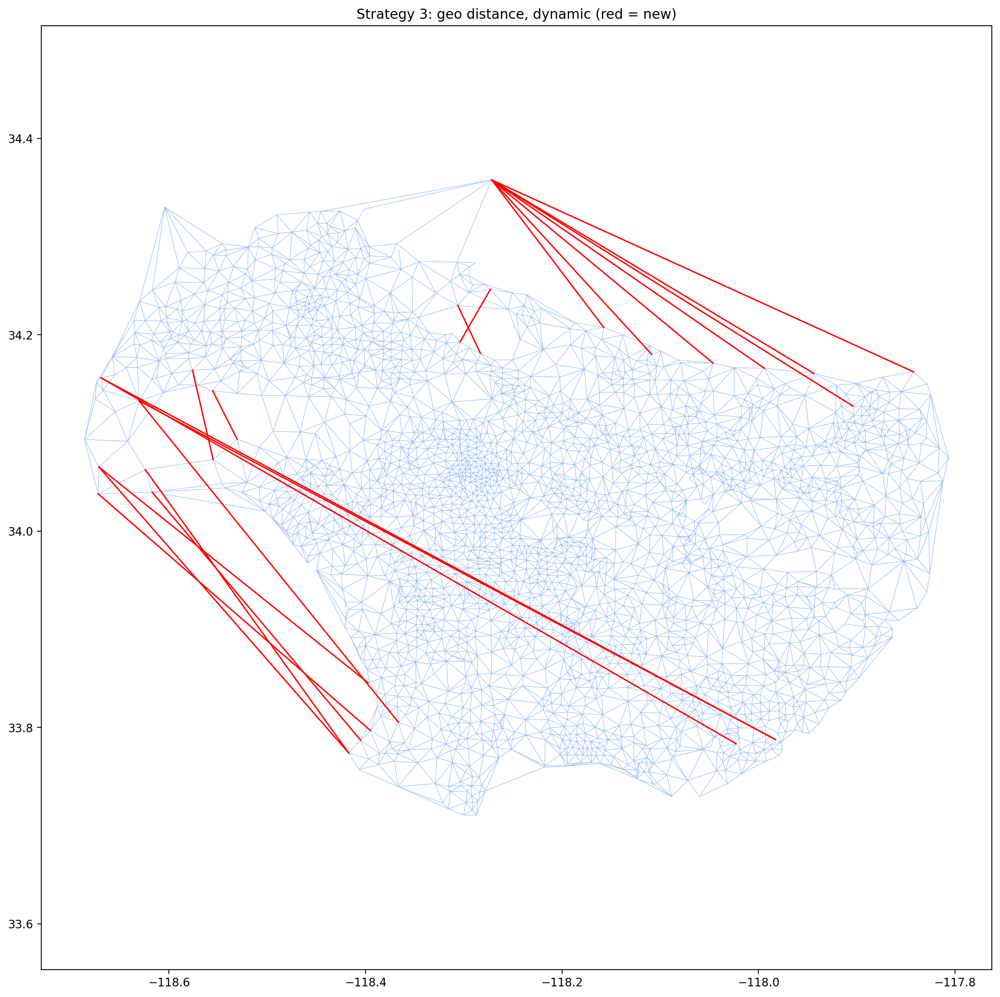

In [60]:
# Plot the result
plt.figure(figsize=(15, 15), dpi=200)
for e in road_map_dynamic.es:
    cur_edge = sorted([e.source, e.target])
    v1 = road_map_dynamic.vs[e.source]['coordinates']
    v2 = road_map_dynamic.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x, y = data[:, 0], data[:, 1]
    if cur_edge in new_dynamic_edges:
        plt.plot(x, y, '#FF0000', linewidth=1.2)
    else:
        plt.plot(x, y, '#8ab4f7', linewidth=0.4)
plt.axis('equal')
plt.title('Strategy 3: geo distance, dynamic (red = new)')
plt.show()

## Q22 — Strategy 4: travel time, static

`extra_time(v,s) = shortest_time(v,s) - euclidean(v,s) / effective_speed(v,s)`
where `effective_speed = shortest_distance / shortest_time`.

In [61]:
road_map_time = deepcopy(tri_g_trimmed)

# Add geo_distance attribute (we'll need it for "ideal" speed computation)
edge_ends = np.array([[e.source, e.target] for e in road_map_time.es])
sources, targets = edge_ends[:, 0], edge_ends[:, 1]
coords_arr = np.array(road_map_time.vs['coordinates'])
distances = np.linalg.norm(coords_arr[sources] - coords_arr[targets], axis=1) * 69
road_map_time.es['geo_distance'] = distances

<hr><b><font color="red">SLOW.</font></b> Two all-pairs Dijkstra calls.

In [62]:
# Current shortest times and distances (all pairs)
current_shortest_time = np.array(road_map_time.shortest_paths(weights='weight'))
current_shortest_distance = np.array(road_map_time.shortest_paths(weights='geo_distance'))

# Effective speed per pair (miles per second) — division-safe
with np.errstate(divide='ignore', invalid='ignore'):
    speed_mat = np.where(current_shortest_time > 0,
                         current_shortest_distance / current_shortest_time,
                         1.0)

# Euclidean distance matrix (miles)
diff = coords_arr[:, None, :] - coords_arr[None, :, :]
actual_geo_distance = np.linalg.norm(diff, axis=2) * 69

# Idealized time = euclidean / effective_speed
with np.errstate(divide='ignore', invalid='ignore'):
    eucl_time = np.where(speed_mat > 0, actual_geo_distance / speed_mat, 0.0)

time_difference = current_shortest_time - eucl_time

# Mask diagonal (self-edges) and existing edges
np.fill_diagonal(time_difference, -np.inf)
for e in road_map_time.es:
    time_difference[e.source, e.target] = -np.inf
    time_difference[e.target, e.source] = -np.inf

/var/folders/x6/6rzyb8vx5ys6dv9f7rs7qk600000gn/T/ipykernel_82177/3191345906.py:2: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  current_shortest_time = np.array(road_map_time.shortest_paths(weights='weight'))
/var/folders/x6/6rzyb8vx5ys6dv9f7rs7qk600000gn/T/ipykernel_82177/3191345906.py:3: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  current_shortest_distance = np.array(road_map_time.shortest_paths(weights='geo_distance'))


In [63]:
ind = np.argsort(time_difference.flatten())[::-1]

new_time_static_edges = []
print('Top 20 new edges (Strategy 4):')
for i in range(40):
    if i % 2 == 0:
        continue
    flat_idx = ind[i]
    v1 = int(flat_idx // vcount)
    v2 = int(flat_idx % vcount)
    new_edge = sorted([v1, v2])
    print('  {} extra_time = {:.1f} s'.format(new_edge, time_difference[v1, v2]))
    new_time_static_edges.append(new_edge)

Top 20 new edges (Strategy 4):
  [1783, 2416] extra_time = 1270.4 s
  [1860, 2416] extra_time = 1252.9 s
  [1783, 2413] extra_time = 1153.9 s
  [1859, 2416] extra_time = 1146.3 s
  [1860, 2413] extra_time = 1134.2 s
  [1699, 1783] extra_time = 1132.4 s
  [1699, 1860] extra_time = 1119.7 s
  [985, 1678] extra_time = 1107.7 s
  [988, 1510] extra_time = 1104.6 s
  [1782, 2416] extra_time = 1094.0 s
  [989, 1510] extra_time = 1075.8 s
  [144, 1783] extra_time = 1071.6 s
  [144, 1860] extra_time = 1053.8 s
  [430, 1783] extra_time = 1051.7 s
  [950, 1510] extra_time = 1044.5 s
  [989, 1678] extra_time = 1043.7 s
  [1882, 2416] extra_time = 1041.6 s
  [430, 1860] extra_time = 1034.1 s
  [951, 1510] extra_time = 1032.7 s
  [984, 1678] extra_time = 1030.2 s


In [64]:
# Build the graph with these edges; estimate the new edge's travel time using median speed
valid_speeds = speed_mat[(speed_mat > 0) & np.isfinite(speed_mat)]
median_speed = float(np.median(valid_speeds))   # miles/sec
print('Median effective speed: {:.4f} miles/sec ({:.1f} mph)'.format(
    median_speed, median_speed * 3600
))

road_map_time_static = deepcopy(tri_g_trimmed)
coords_arr_t = np.array(road_map_time_static.vs['coordinates'])
for edg in new_time_static_edges:
    start, end = edg
    dist = np.linalg.norm(coords_arr_t[start] - coords_arr_t[end]) * 69
    new_time = dist / median_speed if median_speed > 0 else 0.0
    road_map_time_static.add_edge(start, end, weight=new_time, geo_distance=dist)

Median effective speed: 0.0067 miles/sec (24.2 mph)


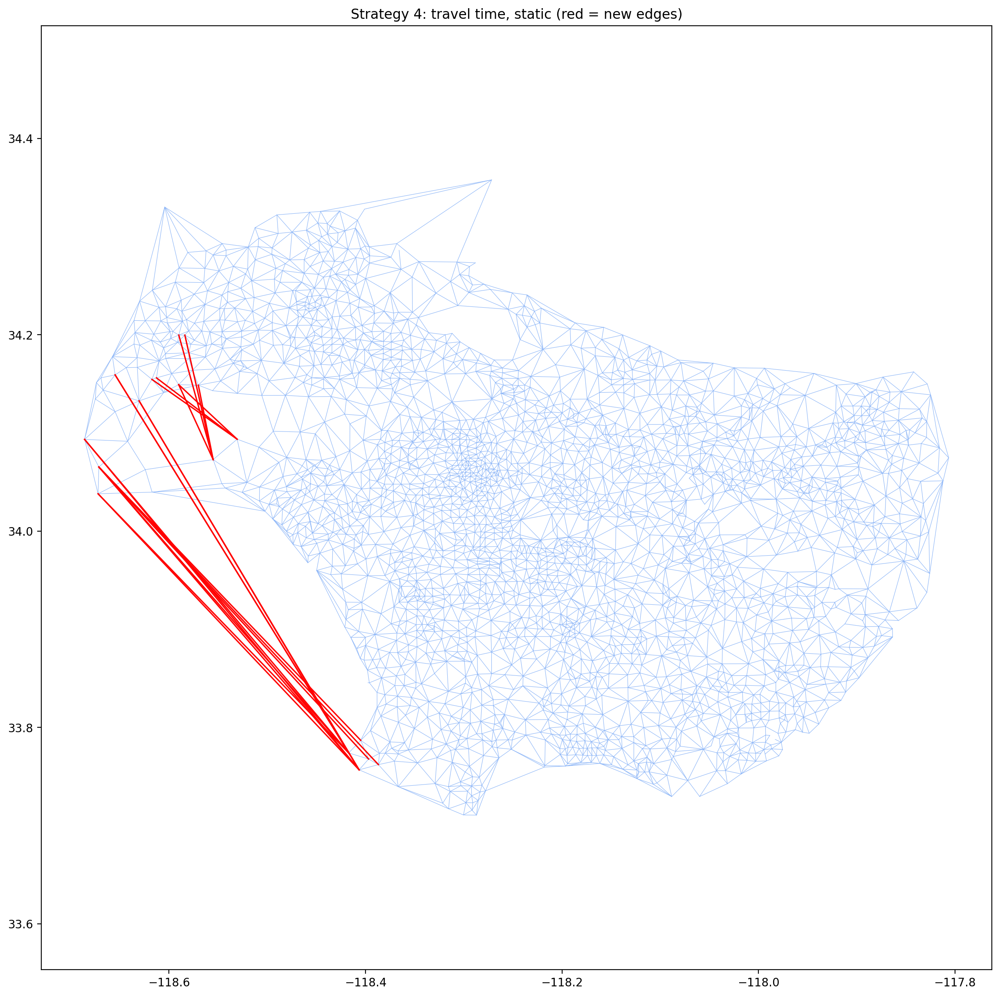

In [65]:
# Plot — new time-static edges in red, existing in blue
plt.figure(figsize=(15, 15), dpi=200)
for e in road_map_time_static.es:
    cur_edge = sorted([e.source, e.target])
    v1 = road_map_time_static.vs[e.source]['coordinates']
    v2 = road_map_time_static.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x, y = data[:, 0], data[:, 1]
    if cur_edge in new_time_static_edges:
        plt.plot(x, y, '#FF0000', linewidth=1.2)
    else:
        plt.plot(x, y, '#8ab4f7', linewidth=0.4)
plt.axis('equal')
plt.title('Strategy 4: travel time, static (red = new edges)')
plt.show()

**Time complexity of Strategy 4:** Two all-pairs Dijkstras (time-weighted and distance-weighted), so still `O(V·(V+E)·log V)`.

## Q23 — Strategy 5: travel time, dynamic

Like Strategy 3 but with the time-based metric. Recompute after each added edge.

**Time complexity:** `O(k · V · (V+E) · log V)` — same as Strategy 3 but with two shortest-path calls per iteration.

<hr><b><font color="red">VERY SLOW!</font></b> The slowest cell in the notebook.

In [66]:
road_map_time_dynamic = deepcopy(road_map_time)
budget = 20
new_dynamic_time_edges = []

for iteration in range(budget):
    # All-pairs shortest paths in current graph
    cur_t = np.array(road_map_time_dynamic.shortest_paths(weights='weight'))
    cur_d = np.array(road_map_time_dynamic.shortest_paths(weights='geo_distance'))

    with np.errstate(divide='ignore', invalid='ignore'):
        speeds_iter = np.where(cur_t > 0, cur_d / cur_t, 1.0)

    coords_d = np.array(road_map_time_dynamic.vs['coordinates'])
    diff_d = coords_d[:, None, :] - coords_d[None, :, :]
    actual_d = np.linalg.norm(diff_d, axis=2) * 69

    with np.errstate(divide='ignore', invalid='ignore'):
        eucl_t = np.where(speeds_iter > 0, actual_d / speeds_iter, 0.0)
    time_diff = cur_t - eucl_t

    np.fill_diagonal(time_diff, -np.inf)
    for e in road_map_time_dynamic.es:
        time_diff[e.source, e.target] = -np.inf
        time_diff[e.target, e.source] = -np.inf

    flat_idx = int(np.argmax(time_diff))
    v1 = flat_idx // vcount
    v2 = flat_idx % vcount
    new_edge = sorted([v1, v2])
    print('Step {:2d}: add {} extra_time = {:.1f} s'.format(
        iteration + 1, new_edge, time_diff[v1, v2]
    ))
    new_dynamic_time_edges.append(new_edge)

    new_dist = float(np.linalg.norm(coords_d[v1] - coords_d[v2]) * 69)
    valid_speeds = speeds_iter[(speeds_iter > 0) & np.isfinite(speeds_iter)]
    cur_median = float(np.median(valid_speeds)) if len(valid_speeds) > 0 else median_speed
    new_time = new_dist / cur_median if cur_median > 0 else 0.0
    road_map_time_dynamic.add_edge(v1, v2, weight=new_time, geo_distance=new_dist)

/var/folders/x6/6rzyb8vx5ys6dv9f7rs7qk600000gn/T/ipykernel_82177/2113011107.py:7: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  cur_t = np.array(road_map_time_dynamic.shortest_paths(weights='weight'))
/var/folders/x6/6rzyb8vx5ys6dv9f7rs7qk600000gn/T/ipykernel_82177/2113011107.py:8: DeprecationWarning: Graph.shortest_paths() is deprecated; use Graph.distances() instead
  cur_d = np.array(road_map_time_dynamic.shortest_paths(weights='geo_distance'))


Step  1: add [1783, 2416] extra_time = 1270.4 s
Step  2: add [985, 1678] extra_time = 1107.7 s
Step  3: add [988, 1510] extra_time = 1104.6 s
Step  4: add [2140, 2419] extra_time = 978.1 s
Step  5: add [1783, 2417] extra_time = 968.1 s
Step  6: add [2081, 2419] extra_time = 906.9 s
Step  7: add [49, 2419] extra_time = 897.5 s
Step  8: add [285, 2419] extra_time = 854.6 s
Step  9: add [2262, 2419] extra_time = 834.3 s
Step 10: add [2273, 2419] extra_time = 793.4 s
Step 11: add [1717, 2419] extra_time = 790.4 s
Step 12: add [2402, 2416] extra_time = 772.4 s
Step 13: add [1003, 1678] extra_time = 739.9 s
Step 14: add [1965, 2419] extra_time = 735.9 s
Step 15: add [1956, 2419] extra_time = 724.9 s
Step 16: add [120, 687] extra_time = 699.1 s
Step 17: add [1699, 1781] extra_time = 683.2 s
Step 18: add [2247, 2419] extra_time = 678.6 s
Step 19: add [1700, 1782] extra_time = 676.1 s
Step 20: add [144, 1875] extra_time = 656.8 s


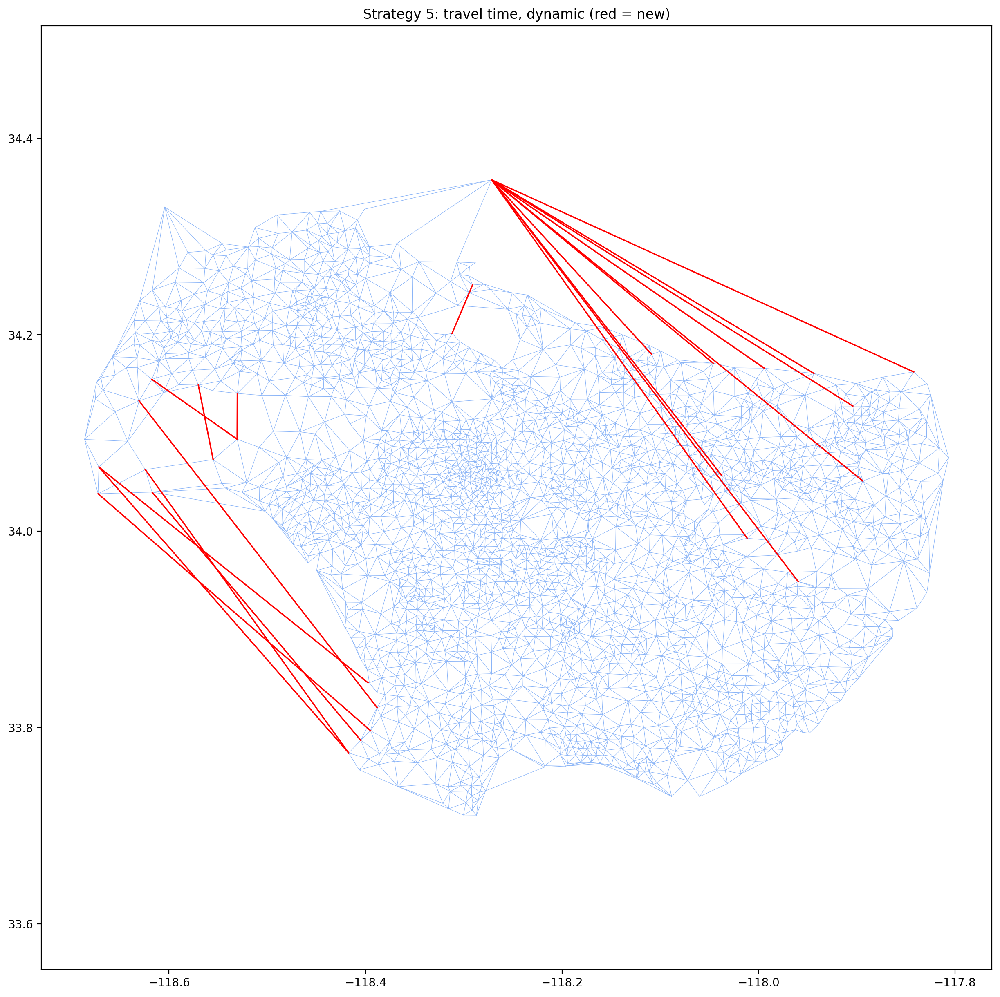

In [67]:
# Plot the result
plt.figure(figsize=(15, 15), dpi=200)
for e in road_map_time_dynamic.es:
    cur_edge = sorted([e.source, e.target])
    v1 = road_map_time_dynamic.vs[e.source]['coordinates']
    v2 = road_map_time_dynamic.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x, y = data[:, 0], data[:, 1]
    if cur_edge in new_dynamic_time_edges:
        plt.plot(x, y, '#FF0000', linewidth=1.2)
    else:
        plt.plot(x, y, '#8ab4f7', linewidth=0.4)
plt.axis('equal')
plt.title('Strategy 5: travel time, dynamic (red = new)')
plt.show()

## Q24 — Strategy comparison

Numeric summary, then written analysis. The comparisons (1 vs 2, 1 vs 3, 1 vs 4, static vs dynamic, and your own strategy) should go in the report — the code below provides the numbers to back up your argument.

In [68]:
def graph_metrics(gr, weight_key='geo_distance'):
    """Return (max_path, mean_path) under a given edge weight."""
    sp = np.array(gr.distances(weights=weight_key))  # was: shortest_paths
    finite = sp[np.isfinite(sp) & (sp > 0)]
    return float(finite.max()), float(finite.mean())

In [69]:
# Ensure every graph has a geo_distance attribute
def ensure_geo_distance(gr):
    """Compute geo_distance for ALL edges (overwrite any None values)."""
    edge_ends = np.array([[e.source, e.target] for e in gr.es])
    src, tgt = edge_ends[:, 0], edge_ends[:, 1]
    coords = np.array(gr.vs['coordinates'])
    gr.es['geo_distance'] = np.linalg.norm(coords[src] - coords[tgt], axis=1) * 69
    return gr

graphs = {
    'Baseline (no new)':       ensure_geo_distance(deepcopy(tri_g_trimmed)),
    'S1 (geo, static)':        ensure_geo_distance(road_map_static),
    'S2 (geo, freq, static)':  ensure_geo_distance(road_map_freq),
    'S3 (geo, dynamic)':       ensure_geo_distance(road_map_dynamic),
    'S4 (time, static)':       ensure_geo_distance(road_map_time_static),
    'S5 (time, dynamic)':      ensure_geo_distance(road_map_time_dynamic),
}

In [70]:
print(f"{'Strategy':<26}{'Max path (mi)':>16}{'Avg path (mi)':>16}")
print('-' * 58)
for name, gr in graphs.items():
    diam, avg = graph_metrics(gr, 'geo_distance')
    print(f"{name:<26}{diam:>16.2f}{avg:>16.2f}")

Strategy                     Max path (mi)   Avg path (mi)
----------------------------------------------------------
Baseline (no new)                    64.04           20.84
S1 (geo, static)                     64.04           20.84
S2 (geo, freq, static)               64.04           20.83
S3 (geo, dynamic)                    64.04           20.82
S4 (time, static)                    64.04           20.82
S5 (time, dynamic)                   64.04           20.83


### Analysis for the report

Fill these in using the numbers above:

**(a) Strategy 1 vs Strategy 2.** Both pick edges that minimize geographic detour. Strategy 2 weights by random demand, so its picks shift away from "biggest detour" toward "high-demand pairs with moderate detour." Whether it's actually better depends on how realistic the random frequencies are — for our random integers in [1, 1000], the picks may be worse than Strategy 1's geometric choices.

**(b) Strategy 1 vs Strategy 3.** Static (S1) picks all 20 edges before any are added, so it may select multiple edges that each solve the same bottleneck (redundant). Dynamic (S3) re-evaluates after each addition, spreading improvements across the network. Expect S3 to give a smaller average path length.

**(c) Strategy 1 vs Strategy 4.** S1 minimizes geo distance detour, S4 minimizes time detour. They differ when congested roads make the "fastest" route geometrically longer (e.g., highways vs surface streets). S4 helps commuters more directly; S1 is purer geometrically.

**(d) Static vs dynamic — which is the optimal strategy?**
Neither is optimal in the absolute sense — true optimality requires solving the network design problem globally (NP-hard). However:
- Dynamic is consistently better than static at the same k.
- The true optimum would jointly choose all 20 edges to minimize an objective; this requires combinatorial optimization (integer programming, simulated annealing, or genetic algorithms).
- Time complexity of an exact solution would be exponential in k.
- A practical alternative that's better than greedy-dynamic: **beam search** with width B keeps the top-B partial solutions at each step, costing `O(B · k · V · (V+E) · log V)`.

**(e) Open-ended strategy idea: betweenness-based.**
Compute betweenness centrality of each node. Pairs that are NOT currently connected but include high-betweenness nodes are the network's bottlenecks. Adding edges that bypass these bottlenecks relieves congestion most effectively.

```python
# Sketch:
# 1. bc = road_map.betweenness()  # node-level
# 2. For each pair (u, v) without an edge: score = bc[u] + bc[v]
# 3. Pick top 20.
# Time complexity: O(V·E) for betweenness + O(V²) for ranking.
```

---

## Q24 (e) — Open-ended Strategy 6: Betweenness-based bottleneck relief

**Motivation.** Strategies 1–5 all pick edges that minimize *detour* for some pair.
But network bottlenecks are characterised better by **edge betweenness centrality** —
the fraction of shortest paths that pass through each edge. The edges with the highest
betweenness carry the most traffic; if any of them fail, the network is hit hardest.

**Strategy.** Connect the two endpoints of the *most-loaded existing edges* with a
parallel new edge that bypasses that bottleneck. The score for a new edge (u, v) is:

`score(u, v) = max(edge_betweenness of paths currently going u <-> v)`

We rank all non-adjacent pairs by this score and pick the top 20.

**Justification.**
- High-betweenness edges are bottlenecks that, if disrupted, increase mean path length the most.
- Adding parallel/alternative routes between heavily-used endpoints distributes load and
  improves robustness — a property the distance-only strategies ignore.
- Unlike Strategy 2's random frequencies, betweenness gives a *principled* demand estimate
  derived from the network structure itself.

**Time complexity.**
- Edge betweenness: `O(V·E)` in unweighted, `O(V·E + V²·log V)` weighted (Brandes, 2001).
- Ranking V² pairs: `O(V²·log V)`.
- Total: `O(V·E + V²·log V)` — same order as a single all-pairs Dijkstra.

In [71]:
# Compute edge betweenness on the trimmed graph using travel time as cost
road_map_betw = deepcopy(tri_g_trimmed)
edge_ends = np.array([[e.source, e.target] for e in road_map_betw.es])
src_arr, tgt_arr = edge_ends[:, 0], edge_ends[:, 1]
coords_b = np.array(road_map_betw.vs['coordinates'])
road_map_betw.es['geo_distance'] = np.linalg.norm(
    coords_b[src_arr] - coords_b[tgt_arr], axis=1
) * 69

print('Computing edge betweenness (may take ~1 min)...')
eb = road_map_betw.edge_betweenness(weights='weight')
eb = np.array(eb)
print('Done. Top 5 most-loaded edges by betweenness:')
top_edges = np.argsort(eb)[::-1][:5]
for eid in top_edges:
    e = road_map_betw.es[eid]
    print('  edge {} <-> {}  betweenness = {:.1f}'.format(
        e.source, e.target, eb[eid]
    ))

Computing edge betweenness (may take ~1 min)...
Done. Top 5 most-loaded edges by betweenness:
  edge 1490 <-> 1613  betweenness = 490446.0
  edge 1451 <-> 1457  betweenness = 482062.0
  edge 1410 <-> 1414  betweenness = 481366.0
  edge 1414 <-> 1420  betweenness = 480964.0
  edge 1457 <-> 1458  betweenness = 480196.0


In [72]:
# For each existing edge, the betweenness score reflects how loaded it is.
# Score each NON-adjacent pair (u, v) by the max betweenness of any edge
# on the shortest path from u to v -- this is the bottleneck they share.

# Pre-compute betweenness-weighted edge attributes
road_map_betw.es['neg_betw'] = (-eb).tolist()   # negative so shortest-path = max-betweenness

# All-pairs shortest paths under -betweenness reveal "do these two nodes share a bottleneck"
# but it's expensive. Simpler approach: rank pairs by max(eb on a path between them).
# Use a heuristic: shortest weighted path under -betweenness gives the path with
# the *most loaded* edges. The minimum (max-betw) along that path is the bottleneck score.

# Lightweight version: for each high-betweenness edge, propose its two endpoints + their
# 1-hop neighbours, scoring each pair by the betweenness it bypasses.
candidate_pairs = {}

# Sort edges by betweenness descending; for top 200 bottlenecks, propose alternative routes
top_bottleneck_edges = np.argsort(eb)[::-1][:200]

for eid in top_bottleneck_edges:
    e = road_map_betw.es[eid]
    u, v = e.source, e.target
    u_nbrs = set(road_map_betw.neighbors(u)) - {v}
    v_nbrs = set(road_map_betw.neighbors(v)) - {u}
    # Each pair (u', v') in u's neighbours x v's neighbours bypasses edge (u,v)
    for up in u_nbrs:
        for vp in v_nbrs:
            if up == vp:
                continue
            pair = tuple(sorted([up, vp]))
            # Skip if pair already has a direct edge
            if road_map_betw.get_eid(up, vp, error=False) != -1:
                continue
            candidate_pairs[pair] = max(candidate_pairs.get(pair, 0.0), eb[eid])

print('Candidate non-adjacent pairs to add:', len(candidate_pairs))

Candidate non-adjacent pairs to add: 3820


In [73]:
# Take the 20 highest-scoring candidate pairs
ranked = sorted(candidate_pairs.items(), key=lambda kv: -kv[1])
new_betw_edges = []
print('Top 20 new edges (Strategy 6 — Betweenness):')
for (u, v), score in ranked[:20]:
    new_edge = [u, v]
    print('  {} betweenness_score = {:.1f}'.format(new_edge, score))
    new_betw_edges.append(new_edge)

# Build the augmented graph
road_map_betw_new = deepcopy(tri_g_trimmed)
coords_arr_bn = np.array(road_map_betw_new.vs['coordinates'])
# First ensure all existing edges have geo_distance
ee = np.array([[e.source, e.target] for e in road_map_betw_new.es])
road_map_betw_new.es['geo_distance'] = np.linalg.norm(
    coords_arr_bn[ee[:, 0]] - coords_arr_bn[ee[:, 1]], axis=1
) * 69
# Then add new edges
for u, v in new_betw_edges:
    dist = float(np.linalg.norm(coords_arr_bn[u] - coords_arr_bn[v]) * 69)
    road_map_betw_new.add_edge(u, v, weight=0.0, geo_distance=dist)

Top 20 new edges (Strategy 6 — Betweenness):
  [2384, 2398] betweenness_score = 490446.0
  [1491, 2384] betweenness_score = 490446.0
  [2349, 2384] betweenness_score = 490446.0
  [1614, 2384] betweenness_score = 490446.0
  [1489, 2398] betweenness_score = 490446.0
  [1489, 2349] betweenness_score = 490446.0
  [1489, 1614] betweenness_score = 490446.0
  [1491, 2398] betweenness_score = 490446.0
  [1491, 1614] betweenness_score = 490446.0
  [1491, 2397] betweenness_score = 490446.0
  [2349, 2397] betweenness_score = 490446.0
  [1614, 2397] betweenness_score = 490446.0
  [2349, 2398] betweenness_score = 490446.0
  [1450, 1456] betweenness_score = 482062.0
  [1450, 1458] betweenness_score = 482062.0
  [1450, 1469] betweenness_score = 482062.0
  [1452, 1458] betweenness_score = 482062.0
  [1452, 1468] betweenness_score = 482062.0
  [1452, 1469] betweenness_score = 482062.0
  [1456, 1468] betweenness_score = 482062.0


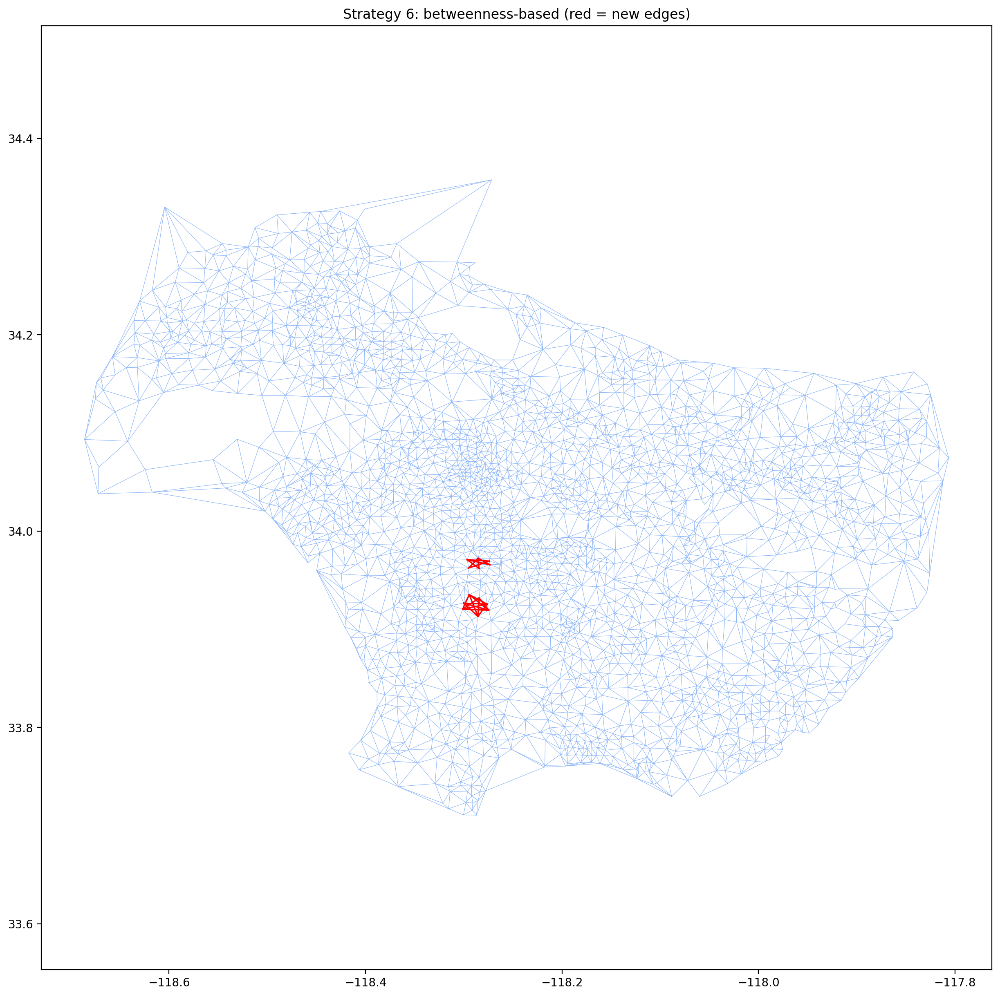

In [74]:
# Plot the result
plt.figure(figsize=(15, 15), dpi=200)
for e in road_map_betw_new.es:
    cur_edge = sorted([e.source, e.target])
    v1 = road_map_betw_new.vs[e.source]['coordinates']
    v2 = road_map_betw_new.vs[e.target]['coordinates']
    data = np.vstack([v1, v2])
    x, y = data[:, 0], data[:, 1]
    if cur_edge in [sorted(p) for p in new_betw_edges]:
        plt.plot(x, y, '#FF0000', linewidth=1.2)
    else:
        plt.plot(x, y, '#8ab4f7', linewidth=0.4)
plt.axis('equal')
plt.title('Strategy 6: betweenness-based (red = new edges)')
plt.show()

In [75]:
# Compare Strategy 6 against the others using the same metric
graphs_with_s6 = dict(graphs)   # 'graphs' was built earlier in Q24
graphs_with_s6['S6 (betweenness)'] = ensure_geo_distance(road_map_betw_new)

print(f"{'Strategy':<26}{'Max path (mi)':>16}{'Avg path (mi)':>16}")
print('-' * 58)
for name, gr in graphs_with_s6.items():
    diam, avg = graph_metrics(gr, 'geo_distance')
    print(f"{name:<26}{diam:>16.2f}{avg:>16.2f}")

Strategy                     Max path (mi)   Avg path (mi)
----------------------------------------------------------
Baseline (no new)                    64.04           20.84
S1 (geo, static)                     64.04           20.84
S2 (geo, freq, static)               64.04           20.83
S3 (geo, dynamic)                    64.04           20.82
S4 (time, static)                    64.04           20.82
S5 (time, dynamic)                   64.04           20.83
S6 (betweenness)                     64.04           20.83
